# Unsupervised Medical Anomaly Detection Using TODS

This notebook represents a summary of the code utilized to perform unsupervised anomaly detection on three medical datasets using TODS. The Time-series Outlier Detection System (TODS) is a Python-based ML package for general-purpose anomaly detection, with a focus on time-series data. The package was developed by Rice’s DATA lab, and contains features for data preprocessing, time-series data smoothing/transformation, extracting features from time domains, and various detection algorithms. While the package focuses on time-series data, anomaly detection in tabular data (like the three datasets investigated in this research) is also supported.

In [2]:
# General libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

# Point-wise anomaly detection algorithms
from tods.sk_interface.detection_algorithm.PCAODetector_skinterface import PCAODetectorSKI
from tods.sk_interface.detection_algorithm.ABOD_skinterface import ABODSKI
from tods.sk_interface.detection_algorithm.CBLOF_skinterface import CBLOFSKI
from tods.sk_interface.detection_algorithm.COF_skinterface import COFSKI
from tods.sk_interface.detection_algorithm.HBOS_skinterface import HBOSSKI
from tods.sk_interface.detection_algorithm.IsolationForest_skinterface import IsolationForestSKI
from tods.sk_interface.detection_algorithm.KNN_skinterface import KNNSKI
from tods.sk_interface.detection_algorithm.LODA_skinterface import LODASKI
from tods.sk_interface.detection_algorithm.LOF_skinterface import LOFSKI
from tods.sk_interface.detection_algorithm.OCSVM_skinterface import OCSVMSKI
from tods.sk_interface.detection_algorithm.SOD_skinterface import SODSKI

# Time-series anomaly detection algorithms
from tods.sk_interface.detection_algorithm.AutoRegODetector_skinterface import AutoRegODetectorSKI
from tods.sk_interface.detection_algorithm.KDiscordODetector_skinterface import KDiscordODetectorSKI

# Evaluation metric functions
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

# Helper method for random sampling
from sklearn.model_selection import train_test_split

# Models for performing principal component analysis (PCA)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Helper library for loading bars
from tqdm import tqdm

2022-08-07 17:29:35.119612: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-07 17:29:35.119743: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [8]:
# Constants
SEED = 0
CARDIO_PATH = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00193/CTG.xls'
SPECTF_PATH = 'https://archive.ics.uci.edu/ml/machine-learning-databases/spect/'
ECG_PATH = '../../Datasets/' # where to find the training/testing datasets locally
ECG_LABEL_COL = 'label' # name of column of labels
MAX_CONTAM = 0.499999

## Dataset 1: [SPECTF Heart Data Set](https://archive.ics.uci.edu/ml/datasets/SPECTF+Heart)

**Summary:** Data on cardiac Single Proton Emission Computed Tomography (SPECT) images. Each patient classified into two categories: normal and abnormal. Features are directly derived from these raw CT images, and are already normalized to be within the range $[0, 100]$.

#### Details

- **Features:** 44 real-valued features (all integers ranging from 0-100)
- **Training size:** 80 instances (40 normal, 40 anomalies)
- **Testing size:** 187 instances (15 normal, 172 anomalies)
- **Labelled?** Yes (first column, `OVERALL_DIAGNOSIS`, contains binary labels, where 0 represents a normal patient and 1 represents an anomalous patient)

#### Differences in Training and Testing Anomaly Distributions

Since the training set provides a 1:1 ratio of normal points to anomalies, a subset of the testing data which also reflects this 1:1 ratio was utilized instead of the full testing set. This was done for three reasons:
1. Many of the anomaly detection techniques in TODS make the assumption that the relative frequencies of normal points and anomalies is representative of their true relative frequencies. If the training and testing sets differ substantially with respect to their relative frequencies of normal points and anomalies, the results will suffer drastically for these particular algorithms.
2. The maximal contamination (anomaly frequency) accepted by TODS algorithms is 0.5 (noninclusive). So, any training or testing set which is more contaminated than this upper bound of 0.5 is likely to cause suboptimal results, as anomaly detection models will need to be trained with an inaccurate contamination threshold. 
3. By definition of the term "anomaly", there should never be more anomalies than normal points in any training or testing set, since anomalies are assumed to occur less frequently than normal points.

In [14]:
# Load SPECTF dataset
spectf_train_data = pd.read_csv(SPECTF_PATH + 'SPECTF.train', header=None)
spectf_test_data = pd.read_csv(SPECTF_PATH + 'SPECTF.test', header=None)

# Separate feature columns and label column of training data
spectf_X_train = spectf_train_data.loc[:, spectf_train_data.columns != 0]
spectf_y_train = spectf_train_data.loc[:, spectf_train_data.columns == 0]

# Separate feature columns and label column of testing data
spectf_X_test = spectf_test_data.loc[:, spectf_test_data.columns != 0]
spectf_y_test = spectf_test_data.loc[:, spectf_test_data.columns == 0]

spectf_test_data_normals = spectf_test_data[spectf_test_data.iloc[:, 0] == 0]
spectf_test_data_anoms = spectf_test_data[spectf_test_data.iloc[:, 0] == 1]

# Create 1:1 distribution of normal and anomalous testing points
spectf_test_data_even_dist = pd.concat([spectf_test_data_normals.sample(15, random_state=SEED),
                                        spectf_test_data_anoms.sample(15, random_state=SEED)]).reset_index(drop=True)
spectf_X_test_even_dist = spectf_test_data_even_dist.loc[:, spectf_train_data.columns != 0]
spectf_y_test_even_dist = spectf_test_data_even_dist.loc[:, spectf_train_data.columns == 0]

# Print normal/anomalous counts
print(spectf_y_train.value_counts())
print(spectf_y_test.value_counts())
# Display dataframe
spectf_train_data

0    40
1    40
dtype: int64
1    172
0     15
dtype: int64


,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
0,1,59,52,70,67,73,66,72,61,58,...,66,56,62,56,72,62,74,74,64,67
1,1,72,62,69,67,78,82,74,65,69,...,65,71,63,60,69,73,67,71,56,58
2,1,71,62,70,64,67,64,79,65,70,...,73,70,66,65,64,55,61,41,51,46
3,1,69,71,70,78,61,63,67,65,59,...,61,61,66,65,72,73,68,68,59,63
4,1,70,66,61,66,61,58,69,69,72,...,67,69,70,66,70,64,60,55,49,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,70,75,72,72,67,71,71,78,63,...,66,67,68,70,70,71,64,67,56,54
76,0,59,57,67,71,66,68,68,70,56,...,62,64,56,53,71,68,64,63,56,56
77,0,67,64,73,75,77,77,74,70,65,...,61,64,65,60,68,75,74,80,67,68
78,0,68,65,72,72,47,74,76,74,67,...,64,69,71,73,73,75,68,56,58,44


## Dataset 2: [Cardiotocography (CTG) Data Set](https://archive.ics.uci.edu/ml/datasets/Cardiotocography)

Summary: Measurements of fetal heart rate (FHR) and uterine contraction (UC) features on cardiotocograms classified by expert obstetricians. CTG monitoring is widely used to assess fetal wellbeing by identifying babies at risk of hypoxia (lack of oxygen). CTG is mainly used during labour.

#### Details
- **Features:** 21 summary statistics of cardiotocograms (# of fetal movements per second, width of FHR histogram, etc.). Mix of real-valued (20) and categorical attributes (1)
- **Training size:** 1700 (1329 normal, 371 anomalous)
- **Testing size:** 426 (326 normal, 100 anomalous)
- **Labelled?** Yes, with two different labelling schemes
    - 10-class FHR pattern class code
    - 3-class fetal state class code with N=normal (1 in dataset), S=suspect (2 in dataset), and P=pathological (3 in dataset)

#### Terminology

- **Acceleration:** a visually apparent abrupt increase in fetal heart rate (an abrupt increase is defined as an increase from the onset of acceleration to the peak in 30 seconds or less).
- **Deceleration:** a visually apparent abrupt decrease in fetal heart rate (an abrupt decrease is defined as an decrease from the onset of acceleration to the valley in 30 seconds or less).
- **Hypoxia:** an absence of enough oxygen in the tissues to sustain bodily functions.
- **Acidosis:** a buildup of acid in the bloodstream.

#### Explanations of Anomaly Classes (per [here](https://en.wikipedia.org/wiki/Cardiotocography#Updated_2015_FIGO_Intrapartum_Fetal_Monitoring_Guidelines))
1. **Normal (N):** No hypoxia or acidosis; no intervention necessary to improve fetal oxygenation state.
    - Baseline 110–160 bpm (fetal heartrate)
    - Variability 5–25 bpm (fetal heartrate)
    - No repetitive decelerations (decelerations are defined as repetitive when associated with >50% contractions)
2. **Suspect (S):** Low probability of hypoxia/acidosis, warrants action to correct reversible causes if identified.
    - Lacking at least one characteristic of normality, but with no pathological features.
3. **Pathological (P):** High probability of hypoxia/acidosis, requires immediate action to correct reversible causes, adjunctive methods, or if this is not possible expedite delivery. In acute situations, delivery should happen immediately.
    - Baseline < 100 bpm (fetal heartrate)
    - Reduced or increased variability or sinusoidal pattern
    - Repetitive late or prolonged decelerations for >30 min, or >20 min if reduced variability (decelerations are defined as repetitive when associated with >50% contractions)
    - Deceleration >5 minutes

In [13]:
# Load Cardiotocography dataset
cardio_full_raw = pd.read_excel(CARDIO_PATH, sheet_name='Data', header=1)
cardio_X_full = cardio_full_raw.iloc[:2126, 10:31]
cardio_y_full_3 = cardio_full_raw.iloc[:2126, cardio_full_raw.columns.get_loc('NSP')].astype(np.int16)
cardio_y_full = cardio_y_full_3.replace({1: 0, 2: 1, 3: 1}).rename('y')
cardio_X_train, cardio_X_test, cardio_y_train, cardio_y_test = train_test_split(cardio_X_full, cardio_y_full,
                                                                                test_size=0.2, random_state=SEED)

# Print normal/anomalous counts
print(cardio_y_train.value_counts())
print(cardio_y_test.value_counts())
# Display dataframe (NSP column is the raw multilabel column)
pd.concat([cardio_X_full, cardio_y_full_3], axis=1)

0    1329
1     371
Name: y, dtype: int64
0    326
1    100
Name: y, dtype: int64


,LB,AC.1,FM.1,UC.1,DL.1,DS.1,DP.1,ASTV,MSTV,ALTV,...,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency,NSP
0,120.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2
1,132.0,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1
2,133.0,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1
3,134.0,0.002561,0.000000,0.007682,0.002561,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1
4,132.0,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.0,0.000000,0.000000,0.007426,0.000000,0.0,0.0,79.0,0.2,25.0,...,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2
2122,140.0,0.000775,0.000000,0.006971,0.000000,0.0,0.0,78.0,0.4,22.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2
2123,140.0,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2
2124,140.0,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2


## Dataset 3: [ECG Heartbeat Categorization Data Set](https://www.kaggle.com/datasets/shayanfazeli/heartbeat?resource=download&select=ptbdb_normal.csv)

Summary: Consists of heartbeat signals derived from the [MIT-BIH Arrhythmia Dataset](https://www.physionet.org/content/mitdb/1.0.0/). The signals correspond to electrocardiogram (ECG) shapes of heartbeats for the normal case and the cases affected by different arrhythmias and myocardial infarction. These signals are preprocessed and segmented, with each segment corresponding to a heartbeat.

#### Details

- **Features:** 188 time-series ECG points (real-valued, normalized down to the range $[0, 1]$ on a per-row basis), each taken at a sampling frequency of 125 Hz.
- **Training size:** 87554 (in actuality, a randomly-sampled subset of 10000 points was utilized, which contained 8267 normal points and 1733 anomalous points)
- **Testing size:** 21892 (18118 normal, 3774 anomalous)
- **Labelled?** Yes (5-class labelling, ['N': 0, 'S': 1, 'V': 2, 'F': 3, 'Q': 4])

#### Terminology

- **Sinoatrial (SA) node:** a small body of specialized muscle fibers, located in the right atrium of the heart, whose activity is responsible for initiating the heartbeat.
- **Atrioventricular (AV) node:** electrically connects the heart's atria and ventricles to coordinate beating in the top of the heart; it is part of the electrical conduction system of the heart.
- [**Arrhythmia:**](](https://stanfordhealthcare.org/medical-conditions/blood-heart-circulation/arrhythmia/types.html)) improper beating of the heart, whether irregular, too fast, or too slow (normal adults have a heart rate in the 60-100 beats per minute range). There are five main types:
    1. **Tachycardia:** this fast heart rhythm causes a heart rate of more than 100 beats per minute.
    2. **Bradycardia:** this slow heart rhythm causes a heart rate of less than 60 beats per minute.
    3. **Premature heartbeat:** a premature, or extra, beat is a common, usually harmless type of arrhythmia that typically does not cause symptoms.
    4. **Four supraventricular arrhythmias:** tachycardias that occur in the atria or the atrioventricular node.
        1. **Atrial fibrillation (AFib):** irregular, rapid heartbeat that can be intermittent, long lasting, or permanent.
        2. **Atrial flutter:** regular, rapid heartbeat.
        3. **Paroxysmal supraventricular tachycardia (PSVT):** rapid, regular heartbeat that begins and ends suddenly.
        4. **Wolff-Parkinson-White syndrome:** a type of PSVT in which the heart has an extra electrical pathway between the atria and ventricles, disrupting the timing of electrical signals and causing the ventricles to beat too fast
    5. **Three ventricular arrhythmias:** tachycardias that begin in the lower chambers of the heart.
        1. **Ventricular tachycardia (VT):** rapid, regular heartbeat that can last for just a few seconds or much longer, which increases the risk of becoming ventricular fibrillation.
        2. **Ventricular fibrillation (VFib):** rapid, irregular heartbeat that causes the ventricles to quiver ineffectively instead of pumping blood and can lead to sudden cardiac arrest and death within minutes, without emergency care.
        3. **Torsades de pointes:** a type of VT that develops in people with long QT syndrome, an electrical problem that causes the heart to take longer to recharge after each heartbeat, which can lead to VFib and sudden death.
- **Myocardial infarction:** a blockage of blood flow to the heart muscle. Also known as a heart attack.

#### Explanations of Anomaly Classes (mainly per [here](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4085082/))

1. **Normal Beat (N):** heartbeats originating in the sinoatrial node
    - Under normal circumstances, excitation from the sinoatrial node controls the rhythm of the heart.
2. [**Supraventricular Ectopic Beat (S):**](http://cardiacmonitoring.com/ecg-arrhythmia-guide/supraventricular-arrhythmias/supraventricular-ectopic-beat/#:~:text=A%20beat%20that%20is%20premature,atrial%2C%20or%20nodal%20in%20origin.) tachycardias that occur in the atria or the atrioventricular node.
    - Often characterized a beat that is premature, narrow in width but may be slightly different shaped than the patient’s “normal” beats.
    - These beats may be sinus, atrial, or nodal in origin.
    - Originates from the atria or from the atrioventricular node, and includes the four supraventricular arrhythmia types.
    - Atrial premature beat (APB) is the most common heartbeat type and is caused by premature activation of the atrium prior to a normal heartbeat.
3. **Ventricular Ectopic Beat (V):** tachycardias that begin in the lower chambers of the heart.
    - Mainly includes ventricular premature beat (VPB), which is the occurrence of an additional heartbeat from abnormal electrical activation of the ventricles prior to a normal heartbeat.
    - Includes the three ventricular arrhythmia types.
4. **Fusion Beat (F):** a fusion of the previous arrhythmia types.
5. **Unknown Beat (Q):** an arrhythmia that is not easily classified as any of the previous types.


In [11]:
# Load ECG Heartbeat dataset
ecg_train_raw = pd.read_csv(ECG_PATH + 'mitbih_train.csv', header=None).rename(columns={187: ECG_LABEL_COL})
ecg_test_raw = pd.read_csv(ECG_PATH + 'mitbih_test.csv', header=None).rename(columns={187: ECG_LABEL_COL})
ecg_X_train = ecg_train_raw.drop(columns=[ECG_LABEL_COL])
ecg_y_train_5 = ecg_train_raw[ECG_LABEL_COL].rename('multi_labels')
ecg_y_train = ecg_train_raw[ECG_LABEL_COL].replace([2, 3, 4], 1)
ecg_X_test = ecg_test_raw.drop(columns=[ECG_LABEL_COL])
ecg_y_test_5 = ecg_test_raw[ECG_LABEL_COL].rename('multi_labels')
ecg_y_test = ecg_test_raw[ECG_LABEL_COL].replace([2, 3, 4], 1)
ecg_train_sub = ecg_train_raw.sample(10000, random_state=SEED).reset_index(drop=True)
ecg_train_sub_small = ecg_train_raw.sample(1000, random_state=SEED).reset_index(drop=True)
ecg_test_sub = ecg_test_raw.sample(2000, random_state=SEED).reset_index(drop=True)
ecg_X_train_sub = ecg_train_sub.drop(columns=[ECG_LABEL_COL])
ecg_y_train_sub = ecg_train_sub[ECG_LABEL_COL].replace([2, 3, 4], 1)
ecg_X_test_sub = ecg_test_sub.drop(columns=[ECG_LABEL_COL])
ecg_y_test_sub = ecg_test_sub[ECG_LABEL_COL].replace([2, 3, 4], 1)

# Print normal/anomalous counts
print(ecg_y_train_sub.value_counts())
print(ecg_y_test.value_counts())
# Display dataframe
ecg_train_raw

0.0    8267
1.0    1733
Name: label, dtype: int64
0.0    18118
1.0     3774
Name: label, dtype: int64


,0,1,2,3,4,5,6,7,8,9,...,178,179,180,181,182,183,184,185,186,label
0,0.977941,0.926471,0.681373,0.245098,0.154412,0.191176,0.151961,0.085784,0.058824,0.049020,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.960114,0.863248,0.461538,0.196581,0.094017,0.125356,0.099715,0.088319,0.074074,0.082621,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.000000,0.659459,0.186486,0.070270,0.070270,0.059459,0.056757,0.043243,0.054054,0.045946,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.925414,0.665746,0.541436,0.276243,0.196133,0.077348,0.071823,0.060773,0.066298,0.058011,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.967136,1.000000,0.830986,0.586854,0.356808,0.248826,0.145540,0.089202,0.117371,0.150235,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87549,0.807018,0.494737,0.536842,0.529825,0.491228,0.484211,0.456140,0.396491,0.284211,0.136842,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
87550,0.718333,0.605000,0.486667,0.361667,0.231667,0.120000,0.051667,0.001667,0.000000,0.013333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
87551,0.906122,0.624490,0.595918,0.575510,0.530612,0.481633,0.444898,0.387755,0.322449,0.191837,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
87552,0.858228,0.645570,0.845570,0.248101,0.167089,0.131646,0.121519,0.121519,0.118987,0.103797,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0


## Anomaly Detection Functions

The following code blocks contain high-level functional abstractions that allow for an efficient utilization of the TODS sk-learn interface to perform anomaly detection on each of the three aforementioned medical datasets.

In [4]:
def format_binary_confusion_matrix(c_matrix):
    """ Takes a binary confusion matrix summarizing the classification results
        of an anomaly detection modeland returns a string representation of
        the confusion matrix, with content-adjusted whitespace.

    Args:
        c_matrix (ndarray of shape (2, 2)): The binary confusion matrix to
                                            format.

    Returns:
        c_matrix_str (str): The formatted string representation of c_matrix.
    """
    NORMAL_PRED_LABEL = 'Predicted normal (0)'
    ANOMALOUS_PRED_LABEL = 'Predicted anomalous (1)'
    NORMAL_ACTUAL_LABEL = 'Actually normal (0)'
    ANOMALOUS_ACTUAL_LABEL = 'Actually anomalous (1)'
    true_neg  = str(c_matrix[0][0]) # Correctly identified normal points
    false_pos = str(c_matrix[0][1]) # Incorrectly identified normal points
    false_neg = str(c_matrix[1][0]) # Incorrectly identified anomalies
    true_pos  = str(c_matrix[1][1]) # Correctly identified anomalies
    max_val_len = max((len(str(val)) for val in c_matrix.flatten()))
    max_len = max(len(NORMAL_PRED_LABEL), len(ANOMALOUS_PRED_LABEL),
                  len(NORMAL_ACTUAL_LABEL), len(ANOMALOUS_ACTUAL_LABEL),
                  max_val_len)

    def space(cell_content):
        """ Helper function to properly space each "cell" of the confusion
            matrix.

        Args:
            cell_content (str): The contents of a particular confusion matrix
                                cell.

        Returns:
            str: The properly spaced contents of the confusion matrix cell.
        """
        return ' ' * (max_len - len(cell_content)) + cell_content

    return f'{space("")}  {space(NORMAL_PRED_LABEL)}  {space(ANOMALOUS_PRED_LABEL)}\n' + \
           f'{space(NORMAL_ACTUAL_LABEL)}  {space(true_neg)}  {space(false_pos)}\n' + \
           f'{space(ANOMALOUS_ACTUAL_LABEL)}  {space(false_neg)}  {space(true_pos)}\n'

In [5]:
def write_report(file, alg_name, y_true, y_pred, contamination=None):
    """ Writes a performace summary of an anomaly detection model, including a
        confusion matrix, to the specified file object.

    Args:
        file (FileIO): The file object to write performance results to.
        alg_name (str): A string representing the name of the anomaly detection
                        algorithm which produced the given results.
        y_true (Series of size n_samples): A Pandas series containing the true
                                           binary labels (0=normal,
                                           1=anomalous).
        y_pred (Series of size n_samples): A Pandas series containing the
                                           predicted binary labels (0=normal,
                                           1=anomalous).
        contamination (float, optional): Optional parameter to specify the
                                         contamination value used for the
                                         particular anomaly detection model.
                                         Defaults to None.
    """
    file.write('*' * 80 + '\n')
    file.write(f'Algorithm: {alg_name}' + f' (contamination={contamination})\n'
                                          if contamination is not None else '\n')
    file.write('Confusion matrix:\n')
    file.write(format_binary_confusion_matrix(confusion_matrix(y_true, y_pred)))
    file.write('Classification report:\n')
    file.write(classification_report(y_true, y_pred, zero_division=1))
    file.write('\n' + '*' * 80 + '\n')

In [6]:
def run_alg(alg, X_train, X_test, y_test, contamination):
    """ Trains the specified unsupervised anomaly detection algorithm on the
        provided training dataset (with the specified contamination
        hyperparameter), then performs predictions on the testing dataset.

    Args:
        alg (class): A class object (from the
                     tods.sk_interface.detection_algorithm module) which
                     implements an unsupervised anomaly detection algorithm that
                     specifies fit and predict methods.
        X_train (DataFrame of shape (n_train_samples, n_features)):
            A Pandas dataframe containing the training data points. 
        X_test (DataFrame of shape (n_test_samples, n_features)):
            A Pandas dataframe containing the testing data points.
        y_test (Series of size n_test_samples): A Pandas series containing the
                                                true labels for each testing
                                                data point. 
        contamination (float): The contamination hyperparameter to utilize when
                               fitting the specified anomaly detection model.

    Returns:
        y_test (Series of size n_test_samples*):
            A Pandas series containing the true labels for each testing point.
            Usually exactly identical to the parameter y_test, but may be
            truncated on the left if the specified algorithm only provides
            predictions for 
        y_test_pred (Series of size n_test_samples*): A Pandas series containing
                                                     the true labels for each
                                                     testing data point.
        * Usually the correct size, but the true size is dependent on the
          specified algorithm. The only guarantee is that the two series will
          be identical in size, and that their identical size will be less than
          or equal to n_test_samples.
    """
    X_train = X_train.to_numpy()
    X_test = X_test.to_numpy()
    y_test = y_test.to_numpy()
    clf = alg(contamination=contamination)
    clf.fit(X_train)
    y_test_pred = clf.predict(X_test).flatten()

    # If the shapes of the true and predicted label series differ, assume that 
    # the algorithm performed a left-truncation (it didn't make predictions for
    # the first x points)
    if y_test_pred.shape[0] < y_test.shape[0]:
        # Notify the user that the specified algorithm did not make a prediction
        # for every testing point.
        print(f'{alg.__name__} gave {y_test_pred.shape[0]} predicted',
                f'labels, but there are {y_test.shape[0]} true labels')
        # Left-truncate the true label vector if necessary
        y_test = y_test[y_test.shape[0] - y_test_pred.shape[0]:]

    # Return the (possibly truncated) true and predected label series
    return y_test, y_test_pred

In [7]:
def calc_contam(y):
    """ Calculates the true contamination of the provided label series.
        Contamination is equivalent to the anomaly frequency in the provided
        label series.

    Args:
        y (Series of size n_samples): A Pandas series containing binary labels
                                      (0=normal, 1=anomalous) which will be used
                                      to calculate the true contamination.

    Returns:
        contam (float): A float in range [0.0, 0.499999] representing the true
                        contamination of y. If the true contamination of y is
                        greater than or equal to 0.5, 0.499999 is returned
                        instead.
    """
    contam = np.sum(y) / y.shape[0]
    contam = 0.499999 if contam >= 0.5 else contam
    contam = 0.0 if contam < 0.0 else contam
    return contam

In [8]:
def run_algs(algs, filepath, X_train, X_test, y_test, y_train=None, contamination=0.1):
    """ Runs the provided list of unsupervised anomaly detection algorithms on
        the provided training dataset, which are each trained with the specified
        contamination hyperparameter. Also performs predictions on the provided
        testing dataset, then writes a performance summary for each algorithm to
        the file located at the specified filepath.

    Args:
        algs (list): A list of class objects, where each class object is from
                     the tods.sk_interface.detection_algorithm module and
                     implements an unsupervised anomaly detection algorithm that
                     specifies fit and predict methods.
        filepath (str): A string representing the local filepath of the desired
                        output file (for the performace summary). If the path
                        points to an existing file, its contents WILL BE
                        OVERWRITTEN.
        X_train (DataFrame of shape (n_train_samples, n_features)):
            A Pandas dataframe containing the training data points. 
        X_test (DataFrame of shape (n_test_samples, n_features)):
            A Pandas dataframe containing the testing data points.
        y_test (Series of size n_test_samples): A Pandas series containing the
                                                true labels for each testing
                                                data point.
        y_train (Series of size n_train_samples, optional): 
            A Pandas series containing the true labels for each training data
            point. If specified, the contamination parameter will not be
            utilized, and instead the true training contamination will be used.
            Defaults to None.
        contamination (float, optional):
            If y_train is not specified, allows the user to manually specify a
            specific contamination value to utilize when training each
            algorithm. Defaults to 0.1.
    """
    # Obtain proper contamination value
    if y_train is not None:
        contamination = np.sum(y_train) / y_train.shape[0]
        contamination = MAX_CONTAM if contamination >= 0.5 else contamination

    with open(filepath, 'w') as file:
        for alg in tqdm(algs):
            # Perform anomaly detection using each algorithm
            y_test, y_test_pred = run_alg(alg, X_train, X_test, y_test,
                                          contamination)
            # Write a performance report for each algorithm
            write_report(file, alg.__name__, y_test, y_test_pred,
                         contamination=contamination)

In [9]:
def run_algs_contam(algs, filepath, X_train, y_train, X_test, y_test, contaminations):
    """ Runs the provided list of unsupervised anomaly detection algorithms on
        the provided training dataset, which are each trained once for each
        contamination value in the provided list of contamination values (as
        well as the true training contamination). Effectively, this function
        allows for an informal grid-search over the contamination
        hyperparameter. Also performs predictions on the provided testing
        dataset, then writes a performance summary for each algorithm to the
        file located at the specified filepath.

    Args:
        algs (list): A list of class objects, where each class object is from
                     the tods.sk_interface.detection_algorithm module and
                     implements an unsupervised anomaly detection algorithm that
                     specifies fit and predict methods.
        filepath (str): A string representing the local filepath of the desired
                        output file (for the performace summary). If the path
                        points to an existing file, its contents WILL BE
                        OVERWRITTEN.
        X_train (DataFrame of shape (n_train_samples, n_features)):
            A Pandas dataframe containing the training data points. 
        y_train (Series of size n_train_samples): 
            A Pandas series containing the true labels for each training data
            point.
        X_test (DataFrame of shape (n_test_samples, n_features)):
            A Pandas dataframe containing the testing data points.
        y_test (Series of size n_test_samples): A Pandas series containing the
                                                true labels for each testing
                                                data point.
        contaminations (list): A list of floats in the range [0.0, 0.5), which
                               will be used as contamination values when
                               training the specified algorithms.
    """
    true_contam = calc_contam(y_train)
    contaminations.append(true_contam)
    contaminations.sort()
    with open(filepath, 'w') as file:
        for alg in tqdm(algs):
            file.write('*' * 80 + '\n')
            file.write(f'Algorithm: {alg.__name__} (true contamination = {true_contam})\n')
            for contam in contaminations:
                y_test, y_test_pred = run_alg(alg, X_train, X_test, y_test,
                                              contam)
                file.write(f'   Contamination = {"{:.4f}".format(contam)}: ')
                f1 = f1_score(y_test, y_test_pred, average="macro", zero_division=1)
                file.write(f'F1 (macro) = {"{:.4f}".format(f1)}\n')
            file.write('\n' + '*' * 80 + '\n')

## Experiments

The following code blocks represent preliminary experiments to attain baseline results for each unsupervised anomaly detection algorithm, as well as an informal grid search over the contamination hyperparameter.

The results from the following experiments are summarized in the below table, which highlights the maximal macro-F1 scores obtained from testing each unsupervised anomaly detection algorithm on each of the three medical datasets (after the contamination grid search was performed). The table itself was created by manually inspecting the outputs of the following experiments to identify the top-performing configurations.

| Algorithm | SPECTF | CTG | MIT-BIH |
| --------- | :------: | :---: | :-------: |
| CBLOF | 0.83 | 0.67 | 0.61 |
| COF | 0.80 | 0.57 | 0.52 |
| HBOS | 0.80 | 0.58 | 0.63 |
| IForest | 0.80 | 0.65 | 0.64 |
| KNN | 0.80 | 0.62 | 0.60 |
| LODA | 0.80 | 0.70 | 0.67 |
| LOF | 0.83 | 0.61 | 0.55 |
| OCSVM | 0.33 | 0.23 | 0.67 |
| SOD | 0.73 | 0.54 | 0.56 |

In [10]:
pointwise_algs = [CBLOFSKI, COFSKI, HBOSSKI, IsolationForestSKI, KNNSKI,
                  LODASKI, LOFSKI, OCSVMSKI, SODSKI]
timeseries_algs = [AutoRegODetectorSKI, KDiscordODetectorSKI]

In [11]:
contaminations = list(np.arange(0.05, 0.5, 0.025))

In [ ]:
# Run pointwise anomaly detection algorithms on the SPECTF dataset
run_algs(pointwise_algs, './Outputs/spectf_tods_report.txt', spectf_X_train,
         spectf_X_test, spectf_y_test)

In [ ]:
# Run pointwise anomaly detection algorithms on the SPECTF dataset
run_algs(pointwise_algs, './Outputs/spectf_even_dist_tods_report_test.txt', spectf_X_train,
         spectf_X_test_even_dist, spectf_y_test_even_dist)

In [ ]:
# Run pointwise anomaly detection algorithms on the SPECTF dataset
# (balanced testing set, accurate contamination)
run_algs(pointwise_algs, './Outputs/spectf_even_dist_accurate_contam_tods_report.txt', spectf_X_train,
         spectf_X_test_even_dist, spectf_y_test_even_dist, y_train=spectf_y_train)

In [ ]:
# Run pointwise anomaly detection algorithms on the SPECTF dataset, across
# multiple contamination values
run_algs_contam(pointwise_algs, './Outputs/spectf_even_dist_contams.txt',
                spectf_X_train, spectf_y_train, spectf_X_test_even_dist,
                spectf_y_test_even_dist, contaminations)

In [ ]:
# Run pointwise anomaly detection algorithms on the Cardiotocography dataset
run_algs(pointwise_algs, './Outputs/cardio_tods_report.txt', cardio_X_train,
         cardio_X_test, cardio_y_test)

In [ ]:
# Run pointwise anomaly detection algorithms on the Cardiotocography dataset
run_algs_contam(pointwise_algs, './Outputs/cardio_80_20_all_contam_with_real_contam_tods_report.txt',
                cardio_X_train, cardio_y_train, cardio_X_test, cardio_y_test, contaminations)

In [ ]:
# Run time-series anomaly detection algorithms on the ECG Heartbeat dataset
run_algs(timeseries_algs, './Outputs/ecg_tods_report_10000.txt', ecg_X_train_sub,
         ecg_X_test, ecg_y_test)

In [ ]:
# Run pointwise anomaly detection algorithms on the ECG Heartbeat dataset
run_algs(pointwise_algs,
         './Outputs/ecg_tods_report_20000_just_pointwise.txt', ecg_X_train_sub,
         ecg_X_test, ecg_y_test)

In [ ]:
# Run pointwise anomaly detection algorithms on the ECG Heartbeat dataset
run_algs_contam(pointwise_algs,
                './Outputs/ecg_tods_report_10000_just_pointwise_contams.txt',
                ecg_X_train_sub, ecg_y_train_sub,
                ecg_X_test, ecg_y_test, contaminations)

## Result Visualization

The following code blocks represent efforts to plot PCA dimensionality reductions of each dataset, and color them based on the optimal models identified from the experimentation process. The common legend for the following PCA plots is shown below:

![legend](./Images/small_pca_legend.png)

In [12]:
def compute_pred_stats(y_true, y_pred):
    """ Computes statistics (true positive, true negative, false negative, and
        false positive) for the specified binary anomaly label predictions.
        True positive (TP): Also known as a correctly classified anomalous
                            point.
        True negative (TN): Also known as a correctly classified normal point.
        False negative (FN): Also known as an incorrectly classified anomalous
                             point.
        False positive (FP): Also known as an incorrectly classified normal
                             point.

    Args:
        y_true (Series of size n_samples): A Pandas series containing the true
                                           binary labels (0=normal,
                                           1=anomalous).
        y_pred (Series of size n_samples): A Pandas series containing the
                                           predicted binary labels (0=normal,
                                           1=anomalous).

    Returns:
        pred_stats (Series of size n_samples):
            A Pandas series containing elements in the set {'TP', 'TN', 'FN',
            'FP'}, where the ith element in pred_stats represents the
            corresponding statistic for the ith prediction in y_pred.
    """
    pred_stats = np.empty(shape=y_true.shape[0], dtype=object)
    for i, (y_i, y_pred_i) in enumerate(zip(y_true, y_pred)):
        if y_i == 1 and y_pred_i == 1:
            pred_stats[i] = 'TP'
        elif y_i == 0 and y_pred_i == 0:
            pred_stats[i] = 'TN'
        elif y_i == 1 and y_pred_i == 0:
            pred_stats[i] = 'FN'
        elif y_i == 0 and y_pred_i == 1:
            pred_stats[i] = 'FP'
    return pd.Series(pred_stats, name="stats")

def compute_fnr(y_true, y_pred):
    """ Computes the false negative rate of the specified binary anomaly label
        predictions.

    Args:
        y_true (Series of size n_samples): A Pandas series containing the true
                                           binary labels (0=normal,
                                           1=anomalous).
        y_pred (Series of size n_samples): A Pandas series containing the
                                           predicted binary labels (0=normal,
                                           1=anomalous).

    Returns:
        fnr (float): The false negative rate of y_pred.
    """
    c_matrix = confusion_matrix(y_true, y_pred)
    FN = c_matrix[1][0]
    return FN / np.sum(c_matrix.flatten())

In [105]:
def compute_pca_df(models, X_train, X_pca, y_pca, report_path):
    """ Computes a dataframe containing the first three PCA dimensions of the
        given dataset, associating each data point with corresponding metadata
        which can be later utilized when plotting the PCA dataframe. The
        metadata includes predictions on the X_pca dataset based on the
        specified models, which are all trained on the specified training
        dataset. A performance summary of the training process is also produced.

    Args:
        models (list of length n_models):
            A list of dictionaries which specify the following keys:
                1. "algorithm": The desired class object (from the
                                tods.sk_interface.detection_algorithm module)
                                which implements an unsupervised anomaly
                                detection algorithm that specifies fit and
                                predict methods. 
                2. "contamination": The desired contamination value, in the
                                    range [0.0, 0.5), to train the model with. 
                3. "name": The name of the model.
        X_train (DataFrame of shape (n_train_samples, n_features)):
            The training dataset (all models in the models list will be
            trained on this dataset).
        X_pca (DataFrame of shape (n_pca_samples, n_features)):
            The dataset for which the PCA will be performed upon. This is also
            the testing dataset for each of the specified models.
        y_pca (Series of size n_pca_samples):
            The binary labels for each point in X_pca (0=normal, 1=anomalous).
        report_path (str): The local filepath where a summary report should be
                           created for the model training process.
    
    Returns:
        labelled_pca_df (DataFrame of shape (n_pca_samples, 5 + n_models * 4)):
            The PCA dataframe containing the associated performance metadata.
    """
    prediction_map_dict = {0: 'Normal Point', 1: 'Anomalous Point'}
    accuracy_map_dict = {
        'TP': 'Correctly Classified Anomalous Point',
        'TN': 'Correctly Classified Normal Point',
        'FP': 'Incorrectly Classified Normal Point',
        'FN': 'Incorrectly Classified Anomalous Point'
    }

    y_pca_strings = y_pca.map(prediction_map_dict).rename('True Label')
    X_pca_standardized = pd.DataFrame(StandardScaler().fit_transform(X_pca),
                                      columns=X_pca.columns)
    pca = PCA(n_components=3)
    principal_components = pca.fit_transform(X_pca_standardized)
    evr_2D = round(np.sum(pca.explained_variance_ratio_[:2]), 3)
    pca_df = pd.DataFrame(data = principal_components,
                                columns = ['pc1', 'pc2', 'pc3'])
    labelled_pca_df = pd.concat([pca_df, y_pca, y_pca_strings],
                                      axis=1)

    with open(report_path, 'w') as file:
        for model in models:
            model_alg = model['algorithm']
            model_contam = model['contamination']
            model_name = model['name']
            
            curr_model = model_alg(contamination=model_contam)
            curr_model.fit(X_train.to_numpy())

            y_pca_pred = pd.Series(curr_model.predict(X_pca.to_numpy()).flatten(),
                                   name=f"{model_name} Predictions")
            y_pca_pred_strings = y_pca_pred.map(prediction_map_dict).rename(f'{model_name} Strings')
            y_pca_pred_stats = compute_pred_stats(y_pca, y_pca_pred).rename(f'{model_name} Stats')
            y_pca_pred_accuracy = y_pca_pred_stats.map(accuracy_map_dict).rename(f'{model_name} Accuracy')

            labelled_pca_df = pd.concat([labelled_pca_df,
                                               y_pca_pred,
                                               y_pca_pred_strings,
                                               y_pca_pred_stats,
                                               y_pca_pred_accuracy], axis=1)

            write_report(file, model_name, y_pca, y_pca_pred, contamination=MAX_CONTAM)

    return labelled_pca_df


In [109]:
# Obtain entire dataset
spectf_X_full = pd.concat([spectf_X_train, spectf_X_test_even_dist], ignore_index=True)
spectf_y_full = pd.concat([spectf_y_train, spectf_y_test_even_dist], ignore_index=True)[0].rename('y')

# Obtain PCA dataframe with results from the two optimal models for the SPECTF dataset
spectf_opt_models = [
                        {
                            'name': 'CBLOF',
                            'algorithm': CBLOFSKI,
                            'contamination': MAX_CONTAM
                        },
                        {
                            'name': 'LOF',
                            'algorithm': LOFSKI,
                            'contamination': 0.4
                        }
                    ]
spectf_pca_df = compute_pca_df(spectf_opt_models,
                               spectf_X_train,
                               spectf_X_full,
                               spectf_y_full,
                               './Outputs/spectf_even_dist_optimal_model.txt')
spectf_pca_df

,pc1,pc2,pc3,y,True Label,CBLOF Predictions,CBLOF Strings,CBLOF Stats,CBLOF Accuracy,LOF Predictions,LOF Strings,LOF Stats,LOF Accuracy
0,1.202649,4.413026,-0.350356,1,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
1,-2.168055,1.364815,1.072283,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
2,1.059125,-5.039924,1.485617,1,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point
3,0.877952,2.482889,-1.173764,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
4,1.722265,-2.165615,-0.583262,1,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point
...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,1.370058,-2.725224,1.352504,1,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point
106,-0.127274,-0.823416,-0.611822,1,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point
107,-2.963371,-0.463709,1.399000,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
108,2.413254,0.014031,-3.769903,1,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point


In [30]:
stats_domain = ['TN', 'TP', 'FN', 'FP']
stats_colors = ['green', 'blue', 'orange', 'red']
stats_palette = { stats_domain[i]:stats_colors[i] for i in range(len(stats_domain))}

In [141]:
# Seaborn plot (for poster)
def plot_poster_pca(df, opt_model_name, yaxis_right=False, **pltkwargs):
    """ Convenience helper function to plot the PCA dataframe (computed by the
        compute_pca_df function) in an aesthetically pleasing manner, at a high
        enough DPI for use on a large poster. Colors the points on the PCA
        according to the optimal model's performance.

    Args:
        df (DataFrame of shape (n_pca_samples, 5 + n_models * 4)):
            The PCA dataframe containing the associated performance metadata.
            Should always be the dataframe returned by the compute_pca_df
            function.
        opt_model_name (str): The name of the optimal model, since the PCA
                              dataframe might contain the results of multiple
                              models. The results of this model will inform the
                              coloring of each point.
        yaxis_right (bool, optional): Specifies whether to have the y-axis on
                                      the right side of the plot labelled
                                      instead of the y-axis on the left side of
                                      the plot. Defaults to False.
        pltkwargs (additional keyword arguments):
            Any additional matplotlib kwargs may be specified here.
    """
    sns.set(rc={"figure.dpi":900, 'savefig.dpi':900})
    sns.set_style("white")
    f, ax = plt.subplots(figsize=(9, 7))
    if yaxis_right:
        ax.yaxis.tick_right()
    pca_plot = sns.scatterplot(data=df,
                               x='pc1',
                               y='pc2',
                               hue=f'{opt_model_name} Accuracy',
                               palette={
                                          'Correctly Classified Anomalous Point': '#372163',
                                          'Correctly Classified Normal Point': '#0ca2b3',
                                          'Incorrectly Classified Normal Point': '#c95502',
                                          'Incorrectly Classified Anomalous Point': '#8f0303'
                                       },
                               style='True Label',
                               markers={'Normal Point': 'o', 'Anomalous Point': 'X'},
                               linewidth=0,
                               ax=ax,
                               **pltkwargs)
    pca_plot.set(xlabel=None)
    pca_plot.set(ylabel=None)
    plt.show()

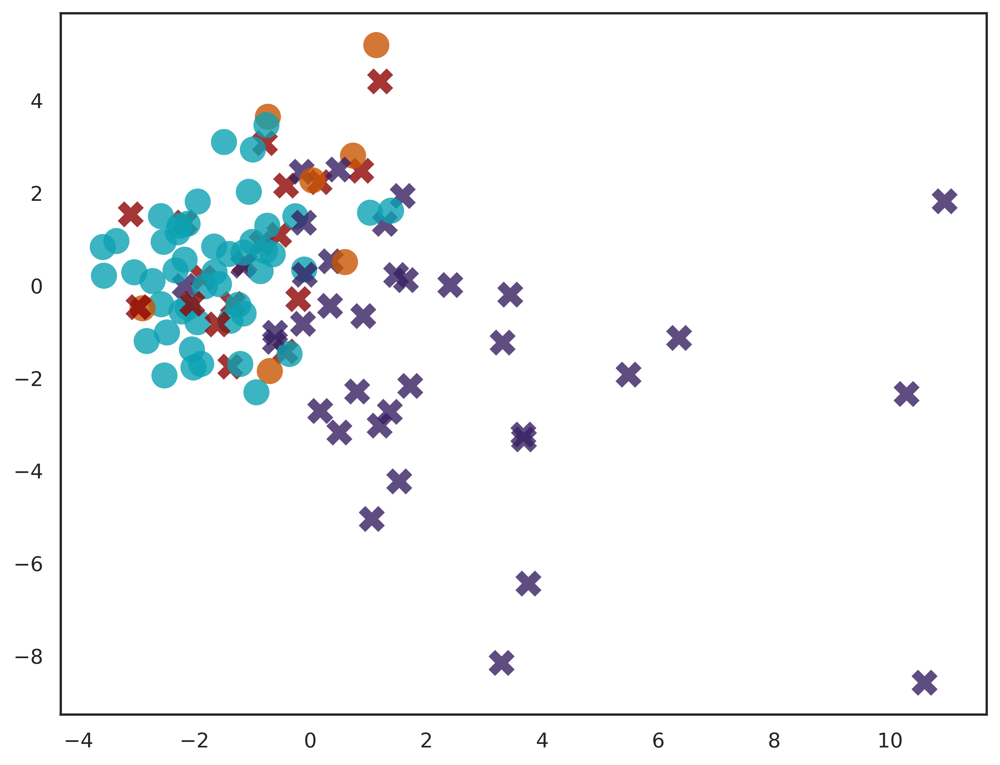

In [142]:
spectf_pca_df_filtered = spectf_pca_df[spectf_pca_df['pc1'] < 20]
plot_poster_pca(spectf_pca_df_filtered, 'LOF', s=200, alpha=0.8, legend=False)

In [125]:
# Obtain PCA dataframe
cardio_opt_models = [
                        {
                            'name': 'LODA',
                            'algorithm': LODASKI,
                            'contamination': calc_contam(cardio_y_train.to_numpy())
                        },
                    ]
cardio_pca_df = compute_pca_df(cardio_opt_models,
                               cardio_X_train,
                               cardio_X_full,
                               cardio_y_full,
                               './Outputs/cardio_full_dataset_optimal_model.txt')
cardio_pca_df

,pc1,pc2,pc3,y,True Label,LODA Predictions,LODA Strings,LODA Stats,LODA Accuracy
0,-0.260703,-2.561548,1.281646,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
1,1.989256,2.266430,-1.109100,0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
2,2.015706,1.998275,-1.285395,0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
3,2.157732,2.101197,-2.188251,0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
4,1.781401,2.161864,-2.492839,0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
...,...,...,...,...,...,...,...,...,...
2121,-2.809411,0.093780,1.440141,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
2122,-2.034708,0.837094,1.264434,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
2123,-2.115154,0.840721,1.320773,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
2124,-2.102081,0.765455,1.407283,1,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point


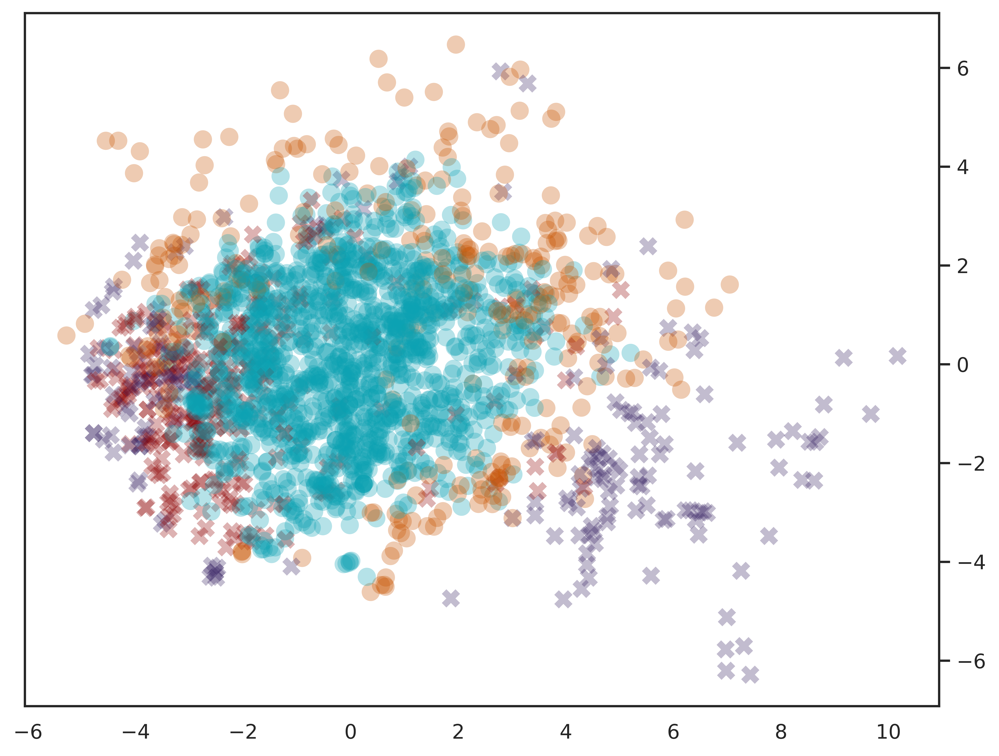

In [137]:
plot_poster_pca(cardio_pca_df, 'LODA', yaxis_right=True, s=100, alpha=0.3, legend=False)

In [131]:
# Combine training and testing points
ecg_X_full = pd.concat([ecg_X_train, ecg_X_test], ignore_index=True)
ecg_y_full = pd.concat([ecg_y_train, ecg_y_test], ignore_index=True)

# Obtain PCA dataframe
ecg_opt_models = [
                     {
                         'name': 'LODA',
                         'algorithm': LODASKI,
                         'contamination': 0.25
                     },
                     {
                         'name': 'OCSVM',
                         'algorithm': OCSVMSKI,
                         'contamination': 0.15
                     }
                 ]
ecg_pca_df = compute_pca_df(ecg_opt_models,
                            ecg_X_train_sub,
                            ecg_X_test,
                            ecg_y_test,
                            './Outputs/ecg_full_dataset_optimal_models.txt')
ecg_pca_df

,pc1,pc2,pc3,label,True Label,LODA Predictions,LODA Strings,LODA Stats,LODA Accuracy,OCSVM Predictions,OCSVM Strings,OCSVM Stats,OCSVM Accuracy
0,-7.300347,1.676807,-1.042171,0.0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
1,2.111480,-4.303146,3.815098,0.0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
2,-4.836656,0.124658,-0.931884,0.0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
3,-1.761845,-2.080396,0.446119,0.0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
4,1.760678,-2.572655,-1.914741,0.0,Normal Point,0,Normal Point,TN,Correctly Classified Normal Point,0,Normal Point,TN,Correctly Classified Normal Point
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21887,10.986915,-6.432266,-2.121778,1.0,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point
21888,16.707913,-7.787958,-2.003459,1.0,Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point,1,Anomalous Point,TP,Correctly Classified Anomalous Point
21889,-6.301223,1.579997,-2.995919,1.0,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point
21890,0.408970,-1.414385,-2.673864,1.0,Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point,0,Normal Point,FN,Incorrectly Classified Anomalous Point


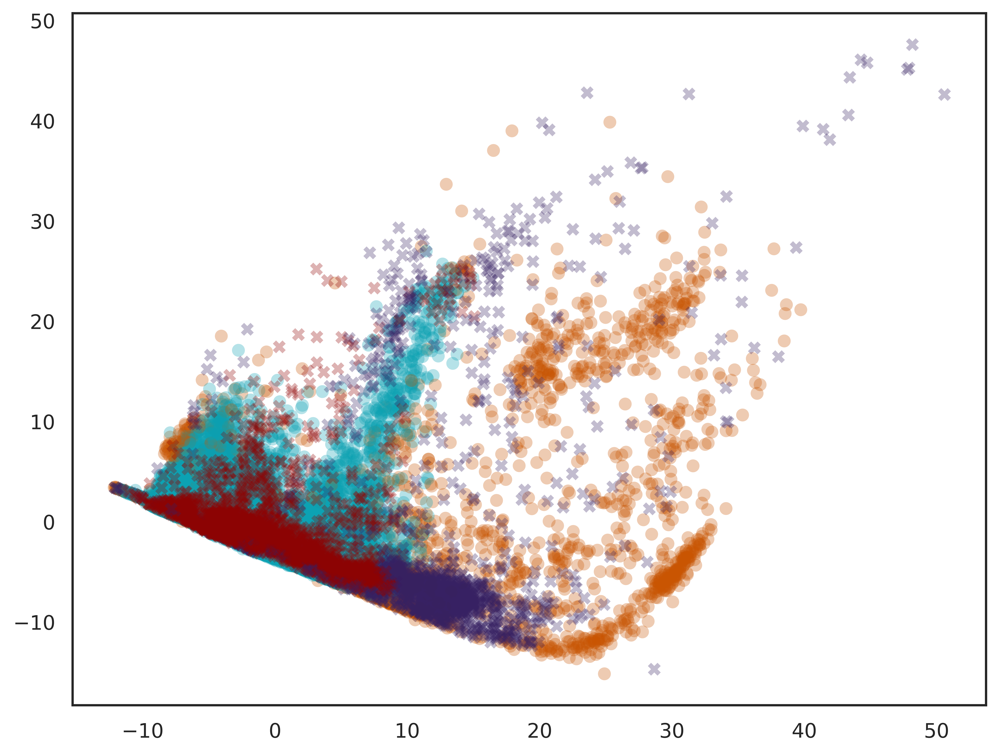

In [143]:
ecg_pca_df_filtered = ecg_pca_df[ecg_pca_df['pc2'] < 60]
plot_poster_pca(ecg_pca_df_filtered, 'OCSVM', s=50, alpha=0.3, legend=False)